#  PBD - CA2
#  PROG9813: 2022/2023 - Programming for Big Data - Spark 
#  Assignment Two

#  Ciaran Finnegan – TU060 (Part Time) – Second Year 
#  MSc in Computer Science (Data Science)

#  Student No : D21124026 
#  April 2023

####  Overview
####  The dataset is from a fraud detection problem in Kaggle

The IEEE Computational Intelligence Society have compiled this dataset of online transactions which are both
credit and debit card purchases.

The Training set contains a flag to indicate which records were found to be fraudulent.
Using this data, the challenge is to build a fraud detection model and assess against a provided Test Set of unlabelled data.

Although each transaction is scored for likelihood of fraud, this is effectively a binary classification problem - marking 'unseen' 
records in the Test Data as 'Fraud' or 'Non-Fraud.

#### Source : https://www.kaggle.com/competitions/ieee-fraud-detection/overview

####  1. Notebook Set Up

#####  Import Required Libraries

In [0]:
## Required PySpark Libraries
from pyspark.sql.functions import col, sum, count, when, isnull, udf
from pyspark.sql import functions as F
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.classification import LogisticRegression, DecisionTreeClassifier, GBTClassifier, LinearSVC, RandomForestClassifier
from pyspark.ml import Pipeline
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator, RegressionEvaluator
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import numpy as np
from pyspark.ml.linalg import DenseVector
from pyspark.sql.types import ArrayType, DoubleType
from sklearn.metrics import confusion_matrix, roc_curve, auc



##### Load Dataset 
Load Transaction data from Databriack file store


##### Kaggle Fraud Transaction Training and Testing datasets are already uploaded into Databricks CE file store

In [0]:
# List the contents of the tables directory
file_list = dbutils.fs.ls('/FileStore/tables')

# Sort the files by name - the reverse sorting shows the Kaggle Train/Test data tables first
sorted_files = sorted(file_list, key=lambda x: x.name, reverse=True)

# Print the sorted file names, and file szie
for file_info in sorted_files:
  print(f"{file_info.name} \t\t- {file_info.size} bytes")


train_transaction_reduced_M1Adj.csv 		- 1727652 bytes
train_transaction_reduced.csv 		- 1727652 bytes
train_transaction.csv 		- 683351067 bytes
train_transaction-1.csv 		- 683351067 bytes
test_transaction_reduced.csv 		- 2638881 bytes
test_transaction.csv 		- 613194934 bytes
happiness_Index_2015.csv 		- 16716 bytes
happiness_Index_2015-1.csv 		- 16716 bytes
emp.csv 		- 722 bytes
dept.csv 		- 119 bytes
BramStokersDracula.txt 		- 883160 bytes
2015_Happiness_Index.csv 		- 16716 bytes
2015_Happiness_Index-2.csv 		- 16716 bytes
2015_Happiness_Index-1.csv 		- 16716 bytes


In [0]:
#file_location = "/FileStore/tables/train_transaction_reduced_M1Adj.csv"

##########################################################
## Load Transaction Data file - Training Set 
##########################################################

# File location and type of Kaggle online transaction data
file_location = "/FileStore/tables/train_transaction.csv"

# CSV options - Set Parameters for reading in data
file_type = "csv"
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df_TrxnTrain = spark.read.format(file_type) \
              .option("inferSchema", infer_schema) \
              .option("header", first_row_is_header) \
              .option("sep", delimiter) \
              .load(file_location)

#### 2. Explore Data
Step Two - Data exploration and preparation for Feature Engineering stage


##### Display the primary characteristics of the data

##### Show Sample Layout

Show initial rows from the Training dataset from Kaggle

In [0]:
##########################################################
## Display Initial Rows in Training Set Data file 
##########################################################

display(df_TrxnTrain)

TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
2987000,0,86400,68.5,W,13926,null,150.0,discover,142.0,credit,315.0,87.0,19.0,null,null,null,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,null,13.0,null,null,null,null,null,null,13.0,13.0,null,null,null,0.0,T,T,T,M2,F,T,null,null,null,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,null,null,gmail.com,null,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,null,null,0.0,null,null,null,null,null,0.0,null,null,null,null,0.0,null,null,null,M0,T,T,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0.0,0.0,1.0,0.0,0.0,0.0,0.0,

In [0]:
##########################################################
## Show Schema in Training Set Data file 
## This assists in a visual identification of the 
## categorical and numeric features in the data
##########################################################
df_TrxnTrain.printSchema()

root
 |-- TransactionID: integer (nullable = true)
 |-- isFraud: integer (nullable = true)
 |-- TransactionDT: integer (nullable = true)
 |-- TransactionAmt: double (nullable = true)
 |-- ProductCD: string (nullable = true)
 |-- card1: integer (nullable = true)
 |-- card2: double (nullable = true)
 |-- card3: double (nullable = true)
 |-- card4: string (nullable = true)
 |-- card5: double (nullable = true)
 |-- card6: string (nullable = true)
 |-- addr1: double (nullable = true)
 |-- addr2: double (nullable = true)
 |-- dist1: double (nullable = true)
 |-- dist2: double (nullable = true)
 |-- P_emaildomain: string (nullable = true)
 |-- R_emaildomain: string (nullable = true)
 |-- C1: double (nullable = true)
 |-- C2: double (nullable = true)
 |-- C3: double (nullable = true)
 |-- C4: double (nullable = true)
 |-- C5: double (nullable = true)
 |-- C6: double (nullable = true)
 |-- C7: double (nullable = true)
 |-- C8: double (nullable = true)
 |-- C9: double (nullable = true)
 |-- C10:

##### Show Sample Size

Show total numble of samples (rows) in the Training dataset from Kaggle

In [0]:
##  Display size of Training dataset - Caching to help with queries
print('Full Txrn data set size = ', df_TrxnTrain.cache().count())


Full Txrn data set size =  590540


##### Check Data Balance

Fraud datasets are often heavily imbalanced with fraud records being a very low proportion of the total dataset

In [0]:
##########################################################
## Determine the balance of fraud and non-Fraud samples in
## the Kaggle Training dataset
##########################################################

# Group the data by the fraud indicator column and count the number of occurrences of each value
grouped_data = df_TrxnTrain.groupBy("isFraud").count().orderBy("count", ascending=False).collect()

# Create a bar chart trace
#trace = go.Bar(x=[row["isFraud"] for row in grouped_data], y=[row["count"] for row in grouped_data])

# Create a bar chart trace
trace = go.Bar(x=["Non-Fraud", "Fraud"], y=[row["count"] for row in grouped_data])


# Create the layout for the bar chart
layout = go.Layout(title="Bar Chart - Balance of Fraud and non-Fraud Records in Kaggle Training Dataset")

# Combine the trace and layout to create the figure
fig = go.Figure(data=[trace], layout=layout)

# Display the figure using the display function
display(fig)

##### Identify Missing Data

Check the categorical and numeric data in the Kaggle Training set and identify missing/null values

In [0]:
###########################################################################
## Define the categorical features from the trxn training set to be encoded

## The Kaggle competition confirms the following categorical features in the Transaction data
## ProductCD
## card4 + card6
## P_emaildomain
## R_emaildomain
## M1 - M9

###########################################################################
categorical_trxn_features = ['ProductCD', 'card4', 'card6', 'P_emaildomain','R_emaildomain', 'M1', 'M2','M3','M4','M5','M6','M7','M8','M9']


In [0]:
###########################################################################
## Create a list of the numerical features
###########################################################################
num_trxn_features = [column for column in df_TrxnTrain.columns if column not in ["isFraud"] + categorical_trxn_features]


In [0]:
#display numercial features
num_trxn_features

Out[10]: ['TransactionID',
 'TransactionDT',
 'TransactionAmt',
 'card1',
 'card2',
 'card3',
 'card5',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'C6',
 'C7',
 'C8',
 'C9',
 'C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'D6',
 'D7',
 'D8',
 'D9',
 'D10',
 'D11',
 'D12',
 'D13',
 'D14',
 'D15',
 'V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28',
 'V29',
 'V30',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V36',
 'V37',
 'V38',
 'V39',
 'V40',
 'V41',
 'V42',
 'V43',
 'V44',
 'V45',
 'V46',
 'V47',
 'V48',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V54',
 'V55',
 'V56',
 'V57',
 'V58',
 'V59',
 'V60',
 'V61',
 'V62',
 'V63',
 'V64',
 'V65',
 'V66',
 'V67',
 'V68',
 'V69',
 'V70',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V76',
 'V77',
 'V78',
 'V79',
 'V80',
 'V81',
 'V

In [0]:
# Using the created PySpark dataframe "df_TrxnTrain" to 
# create a new dataframe of Boolean values indicating null or not
null_trxn_counts = df_TrxnTrain.select([sum(col(c).isNull().cast("int")).alias(c) for c in df_TrxnTrain.columns]) 


In [0]:
# Nulls in categorical Features in Kaggle dataset
display(null_trxn_counts[categorical_trxn_features]) 

ProductCD,card4,card6,P_emaildomain,R_emaildomain,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,1577,1571,94456,453249,271100,271100,271100,281444,350482,169360,346265,346252,346252


In [0]:
# Nulls in numerical Features in Kaggle dataset
display(null_trxn_counts[num_trxn_features]) 

TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,0,0,0,8933,1565,4259,65706,65706,352271,552913,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1269,280797,262878,168922,309841,517353,551623,515614,515614,76022,279287,525823,528588,528353,89113,279287,279287,279287,279287,279287,279287,279287,279287,279287,279287,279287,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,76073,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,168969,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,77096,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,89164,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,314,508595,508595,508595,508595,508595,508589,508589,508589,508595,508595,508595,508595,508589,508589,508589,508595,508595,508595,508595,508595,508595,508589,508589,508595,508595,508595,508589,508589,508589,450909,450909,450721,450721,450721,450909,450909,450721,450721,450909,450909,450909,450909,450721,450909,450909,450909,450721,450721,450909,450909,450721,450721,450909,450909,450909,450909,450721,450721,450909,450721,450721,450909,450721,450721,450909,450909,450909,450909,450909,450909,450721,450721,450721,450909,450909,450909,450909,450909,450909,460110,460110,460110,449124,449124,449124,460110,460110,460110,460110,449124,460110,460110,460110,460110,460110,460110,449124,460110,460110,460110,449124,449124,460110,460110,460110,460110,460110,449124,460110,460110,460110,460110,449124,449124,460110,460110,460110,449124,449124,460110,460110,449124,460110,460110,460110,460110,460110,460110,460110,460110,460110,460110,449124,449124,449124,460110,460110,460110,460110,460110,460110,12,12,1269,1269,1269,12,12,12,12,1269,1269,12,12,12,12,12,12,1269,12,12,12,1269,1269,12,12,12,12,12,12,12,12,12,12,12,1269,1269,1269,12,12,12,12,12,12,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189,508189


In [0]:
# Show scale of null values in numerical fields
df_nulltrxncount = null_trxn_counts[num_trxn_features] 
print('Training Null count set size = ', df_nulltrxncount.cache().count()) # Cache because accessing training data multiple times 


Training Null count set size =  1


In [0]:
# Show scale of null values in numerical fields

# Set the threshold value
threshold = 1600

# Calculate the sum of each column
sums = df_nulltrxncount.select([sum(col(c)).alias(c) for c in df_nulltrxncount.columns])

# Filter out columns that have a total value that exceeds the threshold
exceeding_columns = [c for c in sums.columns if sums.select(col(c)).collect()[0][0] > threshold]

# Print the list of columns that exceed the threshold
print("Columns exceeding threshold:", exceeding_columns)


Columns exceeding threshold: ['card2', 'card5', 'addr1', 'addr2', 'dist1', 'dist2', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', '

#### 3. Prepare Data
Step Three - Data manipulation to prepare dataset for ML modellinh process


##### Rework the dataset to to allow it successfully proceed onto the gneration of an accurate model.

##### Balance Data
Feature Engineering - Balance out dataset to avoid bias in model against detecting fraud.


##### The data contains a significant majority of records that are non fraudulent. Building a model with the original Kaggle dataset will
##### generate a model that is biased towards identifying records as 'non-fraud'.

##### This section of the workbook will down sample the non-fraud records so that there is a smaller dataset, but one with a 50/50 split 
##### of fraud and non-fraud records. This should improve the accuracy of the final model by removing the biad towards the original majority lable.

In [0]:
##########################################################
## Re-balance the number fraud and non-Fraud samples
##########################################################

# Count the number of samples in each class
counts = df_TrxnTrain.groupBy("isFraud").count().collect()
minority_class_count = counts[0][1]
majority_class_count = counts[1][1]


# Calculate the ratio of the number of samples in the minority class to the majority class
ratio = minority_class_count / majority_class_count

# Create a DataFrame with the minority class samples
minority_class = df_TrxnTrain.filter(df_TrxnTrain.isFraud == 1)

# Sample the majority class DataFrame to obtain a subsample with the same number of samples as the minority class DataFrame
majority_class = df_TrxnTrain.filter(df_TrxnTrain.isFraud == 0).sample(withReplacement=False, fraction=ratio, seed=42)

# Concatenate the minority class DataFrame and the balanced majority class DataFrame to obtain the balanced dataset
balanced_data = minority_class.union(majority_class)

In [0]:
##  Display size of Training dataset
##  Caching to help with queries
print('Full Txrn data set size = ', df_TrxnTrain.count())


##  Display size of Training dataset
##  Caching to help with queries
print('Re-balanced Txrn data set size = ', balanced_data.cache().count())

Full Txrn data set size =  590540
Re-balanced Txrn data set size =  41578


In [0]:
##########################################################
## Re-check the balance of fraud and non-Fraud samples 
##########################################################

# Group the data by the fraud indicator column and count the number of occurrences of each value
grouped_balanced_data = balanced_data.groupBy("isFraud").count().orderBy("count", ascending=False).collect()

# Create a bar chart trace
trace = go.Bar(x=["Non-Fraud", "Fraud"], y=[row["count"] for row in grouped_balanced_data])

# Create the layout for the bar chart
layout = go.Layout(title="Bar Chart - Re-Balance of Fraud and non-Fraud Records in Amended Training Dataset")

# Combine the trace and layout to create the figure
fig2 = go.Figure(data=[trace], layout=layout)

# Display the figure using the display function
display(fig2)

In [0]:
##########################################################
## Assign Balanced dataframe to become the dataset on 
## wich we will build the fraud detection model
##########################################################
df_TrxnTrain = balanced_data

##### Missing Data
Feature Engineering - To Handle missing data


##### The data contains many null elements which must be addressed befor the model can be built

In [0]:
# Replace null values in string columns with empty strings
df_TrxnTrain = df_TrxnTrain.na.fill(" ", subset=categorical_trxn_features)

In [0]:
# Replace null values in numeric columns with zeros
df_TrxnTrain = df_TrxnTrain.na.fill(0, subset=num_trxn_features)

In [0]:
##########################################################
## Display Initial Rows in Training Set Data file 
##########################################################

display(df_TrxnTrain)

TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
2987203,1,89760,445.0,W,18268,583.0,150.0,visa,226.0,credit,251.0,87.0,0.0,0.0,aol.com,,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,4.0,2.0,57.0,57.0,52.0,0.0,0.0,0.0,0.0,0.0,0.0,80.0,0.0,0.0,0.0,0.0,374.0,,,,M0,F,T,,,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2987240,1,90193,37.098,C,13413,103.0,185.0,visa,137.0,credit,0.0,0.0,0.0,0.0,hotmail.com,hotmail.com,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.041664123535156,0.04166600108146668,0.0,0.0,0.0,0.0,0.0,0.0,,,,M2,,,,,,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [0]:
# Now check for number of NULLS

# assuming you already have a PySpark dataframe named "df_TrxnTrain"
# create a new dataframe of Boolean values indicating null or not
null_trxn_postprc_counts = df_TrxnTrain.select([sum(col(c).isNull().cast("int")).alias(c) for c in df_TrxnTrain.columns]) 


In [0]:
# Nulls in categorical Features in Kaggle dataset
display(null_trxn_postprc_counts[categorical_trxn_features]) 



ProductCD,card4,card6,P_emaildomain,R_emaildomain,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Nulls in numerical Features in Kaggle dataset
display(null_trxn_postprc_counts[num_trxn_features]) 

TransactionID,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
# Show scale of null values in numerical fields
df_nulltrxncount_postprc = null_trxn_postprc_counts[num_trxn_features] 

print('Training Null count set size (Post Processing) = ', df_nulltrxncount_postprc.cache().count()) 
# Cache because accessing training data multiple times

Training Null count set size (Post Processing) =  1


In [0]:
# Show scale of null values in numerical fields

# Set the threshold value
threshold = 1600

# Calculate the sum of each column
sums = df_nulltrxncount_postprc.select([sum(col(c)).alias(c) for c in df_nulltrxncount_postprc.columns]) 

# Filter out columns that have a total value that exceeds the threshold
exceeding_columns = [c for c in sums.columns if sums.select(col(c)).collect()[0][0] > threshold] 

# Print the list of columns that exceed the threshold
print("Columns exceeding threshold:", exceeding_columns) 


Columns exceeding threshold: []


##### Split Data
Split Data into training/test sets


##### The Kaggle competition provides a seperate 'Training Set' against which the user builds a fraud detections.
##### This is the data just loaded into this workbook.
#

##### This data is used to build and refine the competition model itself - based on 'master' Training data provided by Kaggle (ICS) - and hence the split now to build the model 
#

##### The Kaggle competition provides a seperate 'Test Set' against which the user scores each transaction and submits an entry. This is loaded later in the Notebook when the model is built and refined.

In [0]:
###########################################################################
## Split data into train and test sets

###########################################################################

# A 70/30 split is chosen on the Training data from Kaggle
# The '42' value for the seeds ensures a repeatable split is used to allow effective comparisons of model performance

df_train_trxn_data, df_test_trxn_data = df_TrxnTrain.randomSplit([0.7, 0.3], seed=42)

print('Full Txrn data set size = ', df_TrxnTrain.count())
print('Training Txrn set size = ', df_train_trxn_data.cache().count(), '(', df_train_trxn_data.count()/df_TrxnTrain.count(), '%)') 
print('Test Txrn set size = ', df_test_trxn_data.cache().count(), '(', df_test_trxn_data.count()/df_TrxnTrain.count(), '%)')

Full Txrn data set size =  41578
Training Txrn set size =  29244 ( 0.7033527346192698 %)
Test Txrn set size =  12334 ( 0.2966472653807302 %)


In [0]:
###################################################################
# Verify that the proportion of labels is maintained in each split
###################################################################

# Define the label column name
label_col = "isFraud"

df_list = [df_TrxnTrain, df_train_trxn_data, df_test_trxn_data]
df_name = ['Original Kaggle','Train Split','Test Split']

name_index = 0


for df in df_list: 
  # Get the count of a column
  column_count = df.select("isFraud").count() 

  # Get the count of a certain value of a column
  fraud_value_count = df.filter(df.isFraud == 1).count()
  non_fraud_value_count = df.filter(df.isFraud == 0).count()
  
  print("Data Set... {}".format(df_name[name_index]))
  name_index += 1
  print("Total Label count", column_count)
  print("Fraud Count Ratio", fraud_value_count/column_count)
  print("Non Fraud Count Ratio", non_fraud_value_count/column_count)
  print("\n")


Data Set... Original Kaggle
Total Label count 41578
Fraud Count Ratio 0.49696955120496417
Non Fraud Count Ratio 0.5030304487950359


Data Set... Train Split
Total Label count 29244
Fraud Count Ratio 0.4984270277663794
Non Fraud Count Ratio 0.5015729722336205


Data Set... Test Split
Total Label count 12334
Fraud Count Ratio 0.4935138641154532
Non Fraud Count Ratio 0.5064861358845468




##### Categorical Data
Feature Engineering - To Handle Non-Numeric data


##### The data contains a number of categorical features, which must be addressed befor the model can be built

In [0]:
# Additional Feature Engineering on KAGGLE Dataset

# Typically ML algorithms require data in Numeric format  (IT DEPENDS on language/API/Library/Tool you are using)


#    StringIndexer: Converts a column of string values to a column of label indexes. 
#    OneHotEncoder: Maps a column of category indices to a column of binary vectors, with at most one "1" in each 
#    row that indicates the category index for that row.

#    One-hot encoding in Spark is a two-step process. You first use the StringIndexer, followed by the OneHotEncoder.


# The following two lines are estimators. They return functions that we will later apply to transform the dataset.
stringIndexer_tx = StringIndexer(inputCols=categorical_trxn_features, outputCols=[x + "Index" for x in categorical_trxn_features], handleInvalid="keep") 
encoder_tx = OneHotEncoder(inputCols=stringIndexer_tx.getOutputCols(), outputCols=[x + "OHE" for x in categorical_trxn_features]) 


#### 4. Build Model
Step Four  - Steps to build as accurate a model as possible


##### Set up the key steps to generate a pipeline of actions to build a model
##### Assess the effectiveness of the model using evaluation metrics

In [0]:
#Background: Transformers, estimators, and pipelines
#
# Three important concepts in MLlib machine learning that are illustrated in this notebook are Transformers, Estimators, and Pipelines.
#
#    Transformer: Takes a DataFrame as input, and returns a new DataFrame. Transformers do not learn any parameters from the data and 
#    simply apply rule-based transformations to either prepare data for model training or generate predictions using a trained MLlib model. 
#    You call a transformer with .transform() method.
#
#    Estimator: Learns (or "fits") parameters from your DataFrame via a .fit() method and returns a Model, which is a transformer.
#
#    Pipeline: Combines multiple steps into a single workflow that can be easily run. Creating a machine learning model typically involves 
#    setting up many different steps and iterating over them. Pipelines help you automate this process.

##### Prepare Pipeline
Set up processing steps for Pipeline


##### Set up the key steps to prepare the post feature engineered data for the processing steps necessary to build a model

In [0]:
# Kaggle Dataset

# Combine all feature columns into a single feature vector

# Most MLlib algorithms require a single features column as input. Each row in this column contains a vector of data points 
# corresponding to the set of features used for prediction.

# MLlib provides the VectorAssembler transformer to create a single vector column from a list of columns.

assemblerInputs_tx = [c + "OHE" for c in categorical_trxn_features] + num_trxn_features
vecAssembler_tx = VectorAssembler(inputCols=assemblerInputs_tx, outputCol="features")

##### Train Basic Model
Model Training


##### Begin with a Logisitcal Regression Model to build the transaction fraud detection model

In [0]:
####################################################################
## A user input value will determine which algoritm is used to build
## the model to generate the Kaggle competition submission
####################################################################

# Define a function to get the user input using the input() function
def get_numeric_input(prompt):
    try:
        value = float(input(prompt))
        return value
    except ValueError:
        print("Invalid input. Please enter a numeric value.")
        return get_numeric_input(prompt)


In [0]:
# Use Databricks widgets to create a text input box for the user.
dbutils.widgets.text("user_input", "", "Enter a numeric value:")

In [0]:
# Use the get_numeric_input function to read the user input from the widget
user_value = dbutils.widgets.get("user_input")

# Validate and convert the user input to a float
iAlgoSelection = get_numeric_input(user_value)
print("Numeric value entered:", iAlgoSelection)

2 3

Numeric value entered: 3.0


In [0]:
# Choose algorithm based on user input

if iAlgoSelection == 3:
  # Define the Model - using Gradient-Boosted Trees - GBT
  # GBT is another ensemble method that builds trees sequentially, learning from the previous tree's mistakes. 
  # GBTs often have high accuracy and can handle a mix of feature types.
  algo = GBTClassifier(featuresCol='features', labelCol='isFraud')
  print("GBTClassifier Algorithm selected:", iAlgoSelection)
elif iAlgoSelection == 2:
  # Define the Model - Random Forest - RF
  # Random Forest: An ensemble learning method that constructs multiple decision trees 
  # and aggregates their predictions by majority voting.
  algo = RandomForestClassifier(featuresCol="features", labelCol="isFraud", numTrees=100)
  print("RandomForestClassifier Algorithm selected:", iAlgoSelection)
else:  
   # Define the Model - using logistic regression
   # Logistic Regression: A linear method to model the probability of a certain class 
   # or event existing 
  algo = LogisticRegression(featuresCol="features", labelCol="isFraud", regParam=1.0)
  print("LogisticRegression Algorithm selected:", iAlgoSelection)


GBTClassifier Algorithm selected: 3.0


In [0]:
# Build Kaggle Pipeline

# A Pipeline is an ordered list of transformers and estimators. 
# Define a pipeline to automate and ensure repeatability of the transformations to be applied to a dataset. 
# The pipeline.fit() method returns a PipelineModel, which is a transformer.

# Define the pipeline based on the stages created in previous steps.
pipeline_tx = Pipeline(stages=[stringIndexer_tx, encoder_tx, vecAssembler_tx, algo])

# Define the pipeline model.
pipelineModel_tx = pipeline_tx.fit(df_train_trxn_data)


In [0]:
# Apply the pipeline model to the test dataset.
predDF_tx = pipelineModel_tx.transform(df_test_trxn_data)

##### Evaluate Basic Model
Refine Fraud Detection Model


##### Display performance metrics for basic model

In [0]:
# Display the predictions from the chosen model. 
display(predDF_tx.select("features", "isFraud", "prediction", "probability"))


features,isFraud,prediction,probability
"Map(vectorType -> sparse, length -> 532, indices -> List(1, 5, 11, 17, 73, 126, 128, 131, 136, 138, 141, 144, 147, 150, 153, 154, 155, 156, 157, 158, 159, 164, 165, 167, 169, 170, 171, 173, 174, 175, 185, 186, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 223, 224, 225, 226, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 244, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 263, 264, 265, 266, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 284, 285, 286, 287, 288, 289, 293, 294, 295, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 324, 325, 326, 359, 360, 362, 363, 368, 369, 370, 371, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 403, 404, 405, 409, 410, 411, 413, 414, 420, 421, 422, 423, 424, 425, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 465, 466, 467, 474, 475, 482, 483, 484, 494, 495, 496, 497), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2987243.0, 90246.0, 37.098, 13413.0, 103.0, 185.0, 137.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 45.041664123535156, 0.04166600108146668, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 37.097900390625, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))",1,1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.08837436848903026, 0.9116256315109698))"
"Map(vectorType -> sparse, length -> 532, indices -> List(1, 6, 11, 14, 72, 126, 128, 131, 136, 138, 141, 144, 147, 150, 153, 154, 155, 156, 157, 158, 159, 164, 165, 167, 169, 170, 171, 174, 175, 176, 177, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 223, 224, 225, 226, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 242, 243, 244, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 263, 264, 265, 266, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 284, 285, 286, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 362, 363, 368, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 410, 412, 413, 414, 416, 419, 420, 421, 422, 424, 426, 428, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 456, 459, 462, 463, 464, 466, 469, 474, 475, 482, 483, 484, 494, 495, 496, 497), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2987405.0, 92999.0, 90.57, 4504.0, 500.0, 185.0, 219.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

In [0]:
# Funtion to generate a graph showing model accuracy
def accGraphGen(predictions, algoType):
  # Extract Prediction Results
  labels_and_raw_predictions = predictions.select('isFraud', 'rawPrediction').rdd.collect()

  y_true = [x['isFraud'] for x in labels_and_raw_predictions]
  y_score = [x['rawPrediction'][1] for x in labels_and_raw_predictions]

  fpr, tpr, thresholds = roc_curve(y_true, y_score)
  roc_auc = auc(fpr, tpr)
  
  # Plot Graph
  plt.figure()
  plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
  plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Receiver Operating Characteristic (ROC) - ' + algoType + ' Model')
  plt.legend(loc="lower right")
  plt.show()

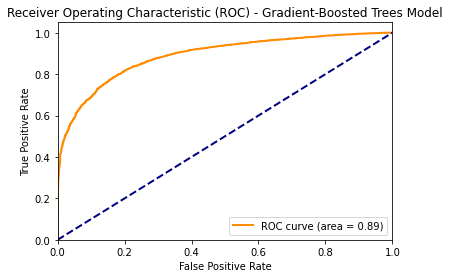

In [0]:
# Display a graphical depiction of prediction accuracy from the chosen model. 
if iAlgoSelection == 3:
  # Model Predictions - Gradient-Boosted Trees - GBT
  accGraphGen(predDF_tx, "Gradient-Boosted Trees")
elif iAlgoSelection == 2:
  # Model Predictions - Random Forest - RF
  accGraphGen(predDF_tx, "Random Forest")
else:  
   # Model Predictions  - Logistic Regression - LR
  accGraphGen(predDF_tx, "Logistic Regression")

In [0]:
# Evaluate the model - for KAGGLE competition
# Use the BinaryClassificationEvaluator to evalute the area under the ROC curve and MulticlassClassificationEvaluator to evalute the accuracy.

# AUPRC is a useful metric in scenarios where there is class imbalance or when the cost of false positives and false negatives are different. 
# It is more informative than the Area Under the Receiver Operating Characteristic (ROC) curve in such situations, as the AUPRC emphasizes 
# the performance of the model on the positive (minority) class.

bcEvaluator_roc = BinaryClassificationEvaluator(labelCol="isFraud", metricName="areaUnderROC")
bcEvaluator_pr = BinaryClassificationEvaluator(labelCol="isFraud", metricName="areaUnderPR")
mcEvaluator = MulticlassClassificationEvaluator(labelCol="isFraud", metricName="accuracy") # Maybe this should not be used?


print(f"Area under ROC curve TRXN: {bcEvaluator_roc.evaluate(predDF_tx)}")
print(f"Area under Precision-Recall curve TRXN: {bcEvaluator_pr.evaluate(predDF_tx)}")
print(f"Accuracy TRXN: {mcEvaluator.evaluate(predDF_tx)}")  # Try Binary Classification Evaluator for accuracy

Area under ROC curve TRXN: 0.8883632633889337
Area under Precision-Recall curve TRXN: 0.8995846873157304
Accuracy TRXN: 0.8080914545159721


In [0]:
# Deploy SQL to generate additional analysis on Fraud detection metrics
predDF_tx.createOrReplaceTempView("basicFraudPredictions")

In [0]:
%sql
SELECT isFraud as Actual_Fraud, prediction as Predicted_Fraud, count(*) AS count
FROM basicFraudPredictions
GROUP BY isFraud, prediction

Actual_Fraud,Predicted_Fraud,count
1,0.0,1411
1,1.0,4676
0,0.0,5291
0,1.0,956


In [0]:
#############################################
## Function to Evaluate the Recall Metric
#############################################

## Recall = True Positives / (True Positives + False Negatives)

def computeRecall(predictions, label):
  # Compute True Positives (TP) and False Negatives (FN) counts
  metrics = (
      predictions
      .select(F.col(label).alias("actual"), F.col("prediction"))
      .groupBy("actual", "prediction")
      .count()
      .collect()
  )

  TP, FN = 0, 0
  for metric in metrics:
      actual, prediction, count = metric
      if actual == 1 and prediction == 1:
          TP = count
      elif actual == 1 and prediction == 0:
          FN = count

  # Calculate recall
  recall = TP / (TP + FN)
  print(f"Recall Value is : {recall:.4f}")


In [0]:
## Invoke function to calculate Recall value of model predictions
computeRecall(predDF_tx, "isFraud")

Recall Value is : 0.7682


##### Refine Model
Refine Fraud Detection Model


##### Use Hyperparameter Tuning and Cross Validation to refine fraud detection model

In [0]:
# Hyperparmeter Tuning of Kaggle Model
# MLlib provides methods to facilitate hyperparameter tuning and cross validation.
#
#    For hyperparameter tuning, ParamGridBuilder lets you define a grid search over a set of model hyperparameters.
#    For cross validation, CrossValidator lets you specify an estimator (the pipeline to apply to the input dataset), an evaluator, a grid space of 
#    hyperparameters, and the number of folds to use for cross validation.

In [0]:
# Set up HyperParameter Grid based on algorithm with which model 
# was generated
if iAlgoSelection == 3:
  # Model Predictions - Gradient-Boosted Trees - GBT
  paramGrid_tx = ParamGridBuilder() \
    .addGrid(algo.maxDepth, [3, 5]) \
    .addGrid(algo.maxIter, [10, 20]) \
    .build()
  
elif iAlgoSelection == 2:
  # CV Parameter Options  -  Random Forest - RF 
  # Build the RF parameter grid for tuning
  paramGrid_tx = ParamGridBuilder() \
    .addGrid(algo.numTrees, [50, 100]) \
    .addGrid(algo.maxDepth, [5, 10]) \
    .addGrid(algo.impurity, ["gini", "entropy"]) \
    .build()
  
else:  
   # CV Parameter Options  - Logistic Regression - LR
  paramGrid_tx = (ParamGridBuilder()
    .addGrid(algo.regParam, [0.1, 0.01])
    .addGrid(algo.elasticNetParam, [0, 1])
    .build())

In [0]:
# Create a 2-fold CrossValidator - the 3 fold option is causing a cluster timeout
cv_tx = CrossValidator(estimator=pipeline_tx, 
                       estimatorParamMaps=paramGrid_tx, 
                       evaluator=bcEvaluator_pr, 
                       numFolds=2)

In [0]:
###############################################################
## The Databricks CE edition will time out when processiing 
## Cross Validation on full 30K Training Set. 
## Hence the training datase for is reduced by 90% to avoid 
## failures during execution.
###############################################################

# Set the fraction for 8.5% cut
fraction = 0.085


# Set a random seed for reproducibility (optional)
seed = 42

# Create a new DataFrame with a 10% cut of the input DataFrame
dfReducedCVTrainSet = df_train_trxn_data.sample(withReplacement=False, fraction=fraction, seed=seed)

# Set the column name and the value you want to count
column_name = "isFraud"
non_fraud_value = 0
fraud_value = 1

# Filter the DataFrame based on the specific value and column
filtered_df_nonFraud = dfReducedCVTrainSet.filter(dfReducedCVTrainSet[column_name] == non_fraud_value)
filtered_df_Fraud = dfReducedCVTrainSet.filter(dfReducedCVTrainSet[column_name] == fraud_value)

# Count the number of entries with the specific value in the column
count_nonFraud = filtered_df_nonFraud.count()
count_Fraud = filtered_df_Fraud.count()

print(f"Number of non-Fraud entries '{non_fraud_value}' in column '{column_name}': {count_nonFraud}")
print(f"Number of Fraud entries '{fraud_value}' in column '{column_name}': {count_Fraud}")

Number of non-Fraud entries '0' in column 'isFraud': 1188
Number of Fraud entries '1' in column 'isFraud': 1236


In [0]:
# cvModel_tx = pipelineModel_tx
# cvModel_tx = cv_tx.fit(df_train_trxn_data) 

# Kaggle - Implement Cross Validation Build of Model

# Run cross validations. This step can be process intensive and returns 
# the best model found from the cross validation.
# CV executed on reduced Training Set to avoid processing timeout on Databricks CE
cvModel_tx = cv_tx.fit(dfReducedCVTrainSet) 


##### Evaluate Refined Model
Evaluate Best Model After Tuning


##### Determine How Effective the best post tuning model performs

In [0]:
# Evaluate model after Hyperparameter Tuning
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF_tx = cvModel_tx.transform(df_test_trxn_data)


In [0]:
# Evaluate the model's performance based on area under the ROC curve, Precions-Recall curve, and Accuracy 
print(f"Area under ROC curve: {bcEvaluator_roc.evaluate(cvPredDF_tx)}")
print(f"Area under Precision-Recall curve TRXN: {bcEvaluator_pr.evaluate(cvPredDF_tx)}")
print(f"Accuracy: {mcEvaluator.evaluate(cvPredDF_tx)}")

Area under ROC curve: 0.862490670402687
Area under Precision-Recall curve TRXN: 0.8737683700062528
Accuracy: 0.7899302740392411


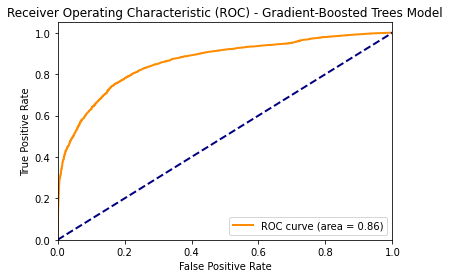

In [0]:
# Display a graphical depiction of prediction accuracy from the chosen model after tuning. 
if iAlgoSelection == 3:
  # Model Predictions - Gradient-Boosted Trees - GBT
  accGraphGen(cvPredDF_tx, "Gradient-Boosted Trees")
elif iAlgoSelection == 2:
  # Model Predictions - Random Forest - SVM
  accGraphGen(cvPredDF_tx, "Random Forest")
else:  
   # Model Predictions  - Logistic Regression - LR
  accGraphGen(cvPredDF_tx, "Logistic Regression")

In [0]:
# Deploy SQL to generate additional analysis on Fraud detection metrics# Kaggle
cvPredDF_tx.createOrReplaceTempView("cvFraudPredictions")

In [0]:
%sql
SELECT isFraud as Actual_Fraud, prediction as Predicted_Fraud, count(*) AS count
FROM cvFraudPredictions
GROUP BY isFraud, prediction


Actual_Fraud,Predicted_Fraud,count
1,0.0,1443
1,1.0,4644
0,0.0,5099
0,1.0,1148


In [0]:
## Invoke function to calculate Recall value of model predictions
computeRecall(cvPredDF_tx, "isFraud")

Recall Value is : 0.7629


#### 5. Generate Kaggle Entry
Step Five - Use Kaggle Test Transactions to generate competition entry


##### The Kaggle file 'Test Transactions' contains the unlablled transaction data against which the competition predictions must be generated.
  
##### Using the model build in this Databricks notebook, a set of predictions for the 'Test Transactions' will be generated.  
  
##### The prediction data will be converted into the format required for the Kaggle submission.

##### Read Kaggle Test Data

The Kaggle 'Test Transactions' file has already been loaded into Databricks

In [0]:
#file_locationCompTest = "/FileStore/tables/test_transaction_reduced.csv"

##########################################################
## Load Kaggle Test Data file - Competition Data
##########################################################

# File location and type of Kaggle online transaction data
file_locationCompTest = "/FileStore/tables/test_transaction.csv"


# The applied options are for CSV files. For other file types, these will be ignored.
df_KaggleCompTest = spark.read.format(file_type) \
                  .option("inferSchema", infer_schema) \
                  .option("header", first_row_is_header) \
                  .option("sep", delimiter) \
                  .load(file_locationCompTest)

In [0]:
##  Display size of Test dataset against which to build competition fraud scores
##  Caching to help with queries
print('Full Kagle Competition Test data set size = ', df_KaggleCompTest.cache().count())

Full Kagle Competition Test data set size =  506691


##### Process Kaggle Test Data

Remove null values from 'Test Transaction' data.

In [0]:
# Replace null values in string columns with empty strings
df_KaggleCompTest = df_KaggleCompTest.na.fill(" ", subset=categorical_trxn_features)

In [0]:
# Replace null values in numeric columns with zeros
df_KaggleCompTest = df_KaggleCompTest.na.fill(0, subset=num_trxn_features)

##### Generate Kaggle Predictions

Use fraud detection model build in this notebook to scan each sample row and generate a prediction for whether the record should be marked as fraudulent or not.

In [0]:
# Evaluate model after Hyperparameter Tuning
# Use the model identified by the cross-validation to make predictions on the test dataset
cvPredDF_CompTest = cvModel_tx.transform(df_KaggleCompTest)

##### Extract Fraud Score 

The probability score in this fraud classification model are stored in a DenseVector object.

Extract the score that indicates liklihood of a fraudulent transaction.

Use these values in the generation of the Kaggle competition submission.

In [0]:
##########################################################
## Define a user-defined function (UDF) to convert the DenseVector object into an array of probabilities
##########################################################

def dense_vector_to_array(vector: DenseVector):
    return vector.toArray().tolist()

dense_vector_to_array_udf = udf(dense_vector_to_array, ArrayType(DoubleType()))


In [0]:
##########################################################
## Apply the UDF to your DataFrame containing the probability column
## The Probability score are extracted from vector into an array in 
## a new column 
##########################################################

# Assuming 'predictions' is your DataFrame with the 'probability' column
cvPredDF_CompTest_with_prob_array = cvPredDF_CompTest.withColumn("probability_array", dense_vector_to_array_udf(cvPredDF_CompTest["probability"]))

# Assuming 'predictions_with_prob_array' is your DataFrame with the 'probability_array' column
cvPredDF_CompTest_with_prob_array = cvPredDF_CompTest_with_prob_array.withColumn("Fraud_Score", col("probability_array").getItem(1))



In [0]:
##########################################################
## Show the prodiction vectors/arrays generated from the Kaggle Test data
##########################################################
display(cvPredDF_CompTest_with_prob_array.select("TransactionID", "probability", "probability_array", "Fraud_Score"))

TransactionID,probability,probability_array,Fraud_Score
3663549,"Map(vectorType -> dense, length -> 2, values -> List(0.6580563453351848, 0.34194365466481524))","List(0.6580563453351848, 0.34194365466481524)",0.34194365466481524
3663550,"Map(vectorType -> dense, length -> 2, values -> List(0.6450390161838613, 0.3549609838161387))","List(0.6450390161838613, 0.3549609838161387)",0.3549609838161387
3663551,"Map(vectorType -> dense, length -> 2, values -> List(0.6214271901223164, 0.3785728098776836))","List(0.6214271901223164, 0.3785728098776836)",0.3785728098776836
3663552,"Map(vectorType -> dense, length -> 2, values -> List(0.9065567771075026, 0.0934432228924974))","List(0.9065567771075026, 0.0934432228924974)",0.0934432228924974
3663553,"Map(vectorType -> dense, length -> 2, values -> List(0.8704588820143885, 0.12954111798561152))","List(0.8704588820143885, 0.12954111798561152)",0.12954111798561152
3663554,"Map(vectorType -> dense, length -> 2, values -> List(0.9116664153420531, 0.08833358465794694))","List(0.9116664153420531, 0.08833358465794694)",0.08833358465794694
3663555,"Map(vectorType -> dense, length -> 2, values -> List(0.5787559812870898, 0.4212440187129102))","List(0.5787559812870898, 0.4212440187129102)",0.4212440187129102
3663556,"Map(vectorType -> dense, length -> 2, values -> List(0.6493989012754554, 0.3506010987245446))","List(0.6493989012754554, 0.3506010987245446)",0.3506010987245446
3663557,"Map(vectorType -> dense, length -> 2, values -> List(0.933036776194289, 0.06696322380571096))","List(0.933036776194289, 0.06696322380571096)",0.06696322380571096
3663558,"Map(vectorType -> dense, length -> 2, values -> List(0.7089787890043451, 0.2910212109956549))","List(0.7089787890043451, 0.2910212109956549)",0.2910212109956549


##### Format Kaggle Submission

Amend prediction output into format required for Kaggle competition.

In [0]:
#############################################
# Use SQL to analyse the submission data for the Kaggle competition
##############################################
cvPredDF_CompTest_with_prob_array.createOrReplaceTempView("CompetitionPredictions")

In [0]:
##########################################################
## Display the numbers of non-Fraud(0) and Fraud(1) 
## predicted in the Kaggle dataset
##########################################################

In [0]:
%sql
SELECT prediction as Predicted_Fraud, count(*) AS Txn_Count
FROM CompetitionPredictions
GROUP BY prediction

Predicted_Fraud,Txn_Count
0.0,400328
1.0,106363


In [0]:
##########################################################
## Display a selection of the non-Fraud(0) and Fraud(1) 
## records with Fraud scores as predicted in the Kaggle dataset
##########################################################

In [0]:
%sql
SELECT TransactionID, prediction as Predicted_Fraud, Fraud_Score
FROM CompetitionPredictions
ORDER BY TransactionID

TransactionID,Predicted_Fraud,Fraud_Score
3663549,0.0,0.34194365466481524
3663550,0.0,0.3549609838161387
3663551,0.0,0.3785728098776836
3663552,0.0,0.0934432228924974
3663553,0.0,0.12954111798561152
3663554,0.0,0.08833358465794694
3663555,0.0,0.4212440187129102
3663556,0.0,0.3506010987245446
3663557,0.0,0.06696322380571096
3663558,0.0,0.2910212109956549


In [0]:
##########################################################
## Generate a dataframe to build a CSV export from this 
## notebook to create the Kaggle competition submission
##########################################################
df_KaggleSubmission = cvPredDF_CompTest_with_prob_array["TransactionID","Fraud_Score"]

In [0]:
display(df_KaggleSubmission)

TransactionID,Fraud_Score
3663549,0.34194365466481524
3663550,0.3549609838161387
3663551,0.3785728098776836
3663552,0.0934432228924974
3663553,0.12954111798561152
3663554,0.08833358465794694
3663555,0.4212440187129102
3663556,0.3506010987245446
3663557,0.06696322380571096
3663558,0.2910212109956549
